In [1]:
from pathlib import Path
from zipfile import ZipFile

import numpy as np
import imageio.v3 as iio
from rich.progress import track

from visionsim.emulate.spc import spc_avg_to_rgb
from visionsim.utils.color import linearrgb_to_srgb

import matplotlib.pyplot as plt

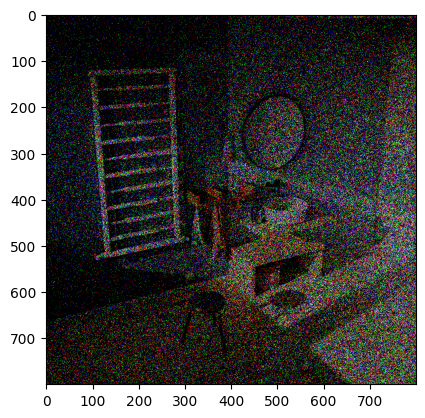

In [104]:
bathroomFilePath = Path("./data/test/blue-bathroom")

bathroom_raw = list(bathroomFilePath.glob("**/*.npy"))

file_first_raw = bathroom_raw[0]

# first_raw_data = np.load(file_first_raw)
first_raw_data = np.load("./data/test/blue-bathroom/000000.npy")
first_raw_data = np.unpackbits(first_raw_data, axis=2)

firstFrame = first_raw_data[1, :, :, :]

plt.imshow(firstFrame * 255)

664


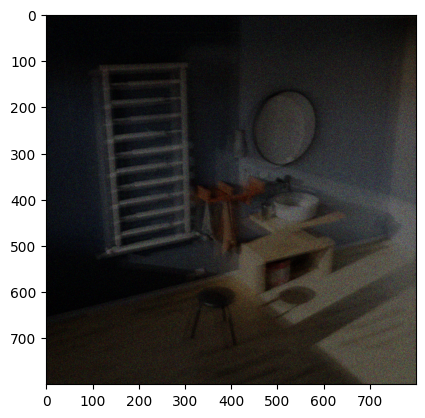

In [105]:
frame_range = 1024

frameSum = np.sum(first_raw_data[:frame_range], axis=0)

print(np.max(frameSum))

frameSum = frameSum / frame_range

plt.imshow(frameSum)

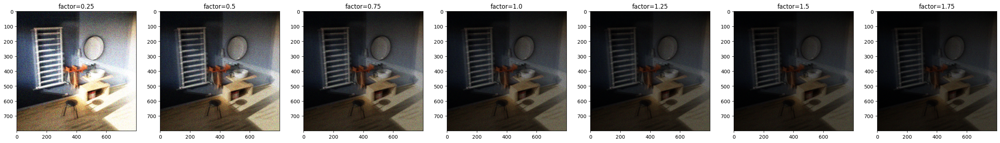

In [106]:
factor_start = 0.25
factor_step = 0.25
factor_stop = 2.0

factor_steps = int((factor_stop - factor_start) / factor_step)

fig, axes = plt.subplots(1, factor_steps, figsize=(5 * factor_steps, 5))

for i in range(factor_steps):
    factor = factor_start + i * factor_step

    img = np.copy(frameSum)
    img = spc_avg_to_rgb(img, factor=factor)
    
    
    ax = axes[i]
    ax.imshow(np.clip(img, 0, 1))
    ax.set_title(f"factor={factor}")

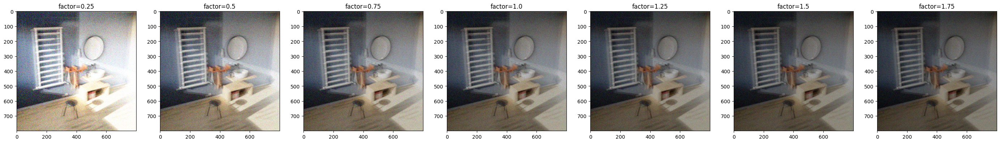

In [ ]:
fig, axes = plt.subplots(1, factor_steps, figsize=(5 * factor_steps, 5))

for i in range(factor_steps):
    factor = factor_start + i * factor_step
    
    img = np.copy(frameSum)
    img = spc_avg_to_rgb(img, factor=factor)
    img = linearrgb_to_srgb(img)

    ax = axes[i]
    ax.imshow(np.clip(img, 0, 1))
    ax.set_title(f"factor={factor}")

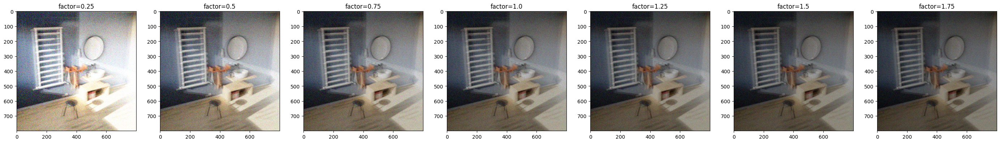

In [114]:
def naivesum_display(
    data_path: Path,
    tonemap: bool = False,
    invert_response: bool = False,
    batch_size: int = 1024,
):
    # Unpack and average last few binary frames
    raw_data_packed = np.load(data_path)
    raw_data = np.unpackbits(raw_data_packed[:batch_size], axis=2)
    img_data = np.sum(raw_data, axis=0) / batch_size

    factor_start = 0.25
    factor_step = 0.25
    factor_stop = 2.0

    factor_steps = int((factor_stop - factor_start) / factor_step)

    fig, axes = plt.subplots(1, factor_steps, figsize=(5 * factor_steps, 5))

    for i in range(factor_steps):
        factor = factor_start + i * factor_step

        img = np.copy(img_data)
        img = spc_avg_to_rgb(img, factor=factor) if invert_response else img
        img = linearrgb_to_srgb(img) if tonemap else img
        
        ax = axes[i]
        ax.imshow(np.clip(img, 0, 1))
        ax.set_title(f"factor={factor}")

naivesum_display("./data/test/blue-bathroom/000000.npy", tonemap=True, invert_response=True, batch_size=1024)


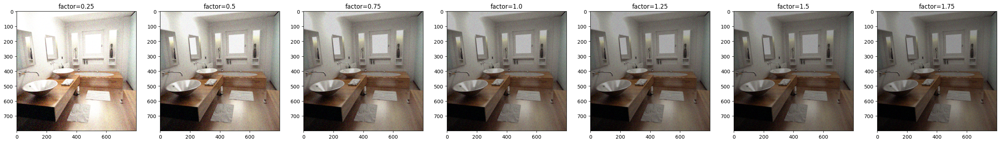

In [118]:
naivesum_display("./data/train/bathroom2/000000.npy", tonemap=True, invert_response=True, batch_size=1024)


In [ ]:
input_dir = Path("./data/train/domestic-office-table/")
input_files = list(input_dir.glob("*.npy"))
input_files = [str(f) for f in input_files]
input_files.sort()

print(input_files)
print(len(input_files))

input_files = input_files[:3]

print(input_files)
print(len(input_files))

for i, file in enumerate(track(input_files)):
    data = np.load(file, mmap_mode="r")
    data = np.unpackbits(data, axis=2)    # (1024, 800, 800, 3)

    # Sum all 1024 frames
    img = np.sum(data, axis=0) / data.shape[0]

    img = spc_avg_to_rgb(img, factor=0.5)
    img = linearrgb_to_srgb(img)

Output()

['data/train/domestic-office-table/000000.npy', 'data/train/domestic-office-table/000001.npy', 'data/train/domestic-office-table/000002.npy', 'data/train/domestic-office-table/000003.npy', 'data/train/domestic-office-table/000004.npy', 'data/train/domestic-office-table/000005.npy', 'data/train/domestic-office-table/000006.npy', 'data/train/domestic-office-table/000007.npy', 'data/train/domestic-office-table/000008.npy', 'data/train/domestic-office-table/000009.npy', 'data/train/domestic-office-table/000010.npy', 'data/train/domestic-office-table/000011.npy', 'data/train/domestic-office-table/000012.npy', 'data/train/domestic-office-table/000013.npy', 'data/train/domestic-office-table/000014.npy', 'data/train/domestic-office-table/000015.npy', 'data/train/domestic-office-table/000016.npy', 'data/train/domestic-office-table/000017.npy', 'data/train/domestic-office-table/000018.npy', 'data/train/domestic-office-table/000019.npy', 'data/train/domestic-office-table/000020.npy', 'data/train/

TypeError: 'Axes' object is not subscriptable

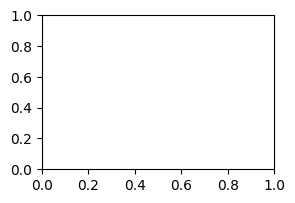

In [ ]:
fig, axes = plt.subplots(figsize=(len(input_files), 2))

ones = np.ones((800, 800))
zeros = np.zeros((800, 800))

red = np.stack([ones, zeros, zeros], axis=-1)
green = np.stack([zeros, ones, zeros], axis=-1)

for i in range(len(input_files)):
    # axes[row, col]
    axes[i, 0].imshow(red)
    axes[i, 1].imshow(green)


In [109]:
# def naivesum(
#     testset: Path,
#     tonemap: bool = False,
#     invert_response: bool = False,
#     batch_size: int = 1024,
# ):
#     with ZipFile("submission.zip", "w") as zipf:
#         for binary_path in track(list(testset.glob("**/*.npy"))):
#             with zipf.open(
#                 str(binary_path.with_suffix(".png").relative_to(testset)), "w"
#             ) as f:
#                 # Unpack and average last few binary frames
#                 pc = np.load(binary_path)
#                 pc = np.unpackbits(pc[-batch_size:], axis=2)
#                 im = pc.sum(axis=0) / batch_size

#                 # Optionally invert the single photon camera's response 
#                 # function and tonemap the image back to sRGB  
#                 im = spc_avg_to_rgb(im, factor=0.5) if invert_response else im
#                 im = linearrgb_to_srgb(im) if tonemap else im

#                 # Convert to uint8 and save into zipfile
#                 im = (im * 255).astype(np.uint8)
#                 iio.imwrite(f, im, extension=".png")

# naivesum("./data/test/basement")
